# Support Vector Machines 
## Instructions
1. Use any dataset from https://archive.ics.uci.edu/datasets?Task=Clustering&skip=0&take=10&sort=desc&orderBy=NumHits&search=&Area=Biology
2. Each student should have a unique dataset otherwise no points will be given, so you need to discuss with your classmate.

In [1]:
from ucimlrepo import fetch_ucirepo
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Fetch dataset
occupancy_detection = fetch_ucirepo(id=357)

# Data (as pandas dataframes)
X = occupancy_detection.data.features
y = occupancy_detection.data.targets

# Combine features and target for convenience
data = X.copy()
data['Target'] = y

# Display the first few rows of the dataset
print(data.head())

# Identify non-numeric columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
print("Non-numeric columns:", non_numeric_columns)

# Remove the date column
data = data.drop(columns=['date'])

# Convert other columns to numeric
for column in non_numeric_columns:
    if column != 'date':
        data[column] = pd.to_numeric(data[column], errors='coerce')

# Verify all columns are numeric
print("Data types after converting to numeric:\n", data.dtypes)


                  date Temperature Humidity  Light     CO2  \
0  2015-02-04 17:51:00       23.18   27.272    426  721.25   
1  2015-02-04 17:51:59       23.15  27.2675  429.5     714   
2  2015-02-04 17:53:00       23.15   27.245    426   713.5   
3  2015-02-04 17:54:00       23.15     27.2    426  708.25   
4  2015-02-04 17:55:00        23.1     27.2    426   704.5   

         HumidityRatio  Target  
0  0.00479298817650529     1.0  
1  0.00478344094931065     1.0  
2  0.00477946352442199     1.0  
3  0.00477150882608175     1.0  
4  0.00475699293331518     1.0  
Non-numeric columns: Index(['date', 'Temperature', 'Humidity', 'Light', 'CO2', 'HumidityRatio'], dtype='object')
Data types after converting to numeric:
 Temperature      float64
Humidity         float64
Light            float64
CO2              float64
HumidityRatio    float64
Target           float64
dtype: object


**TASK: Take 10 moderately sized subsamples your dataset and create a correlation plot for each subsample**

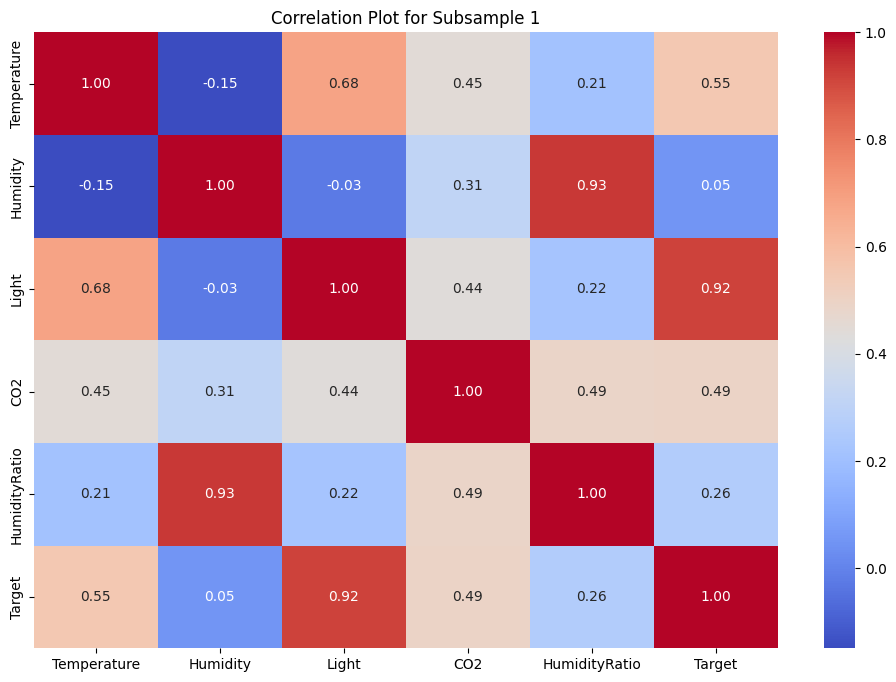

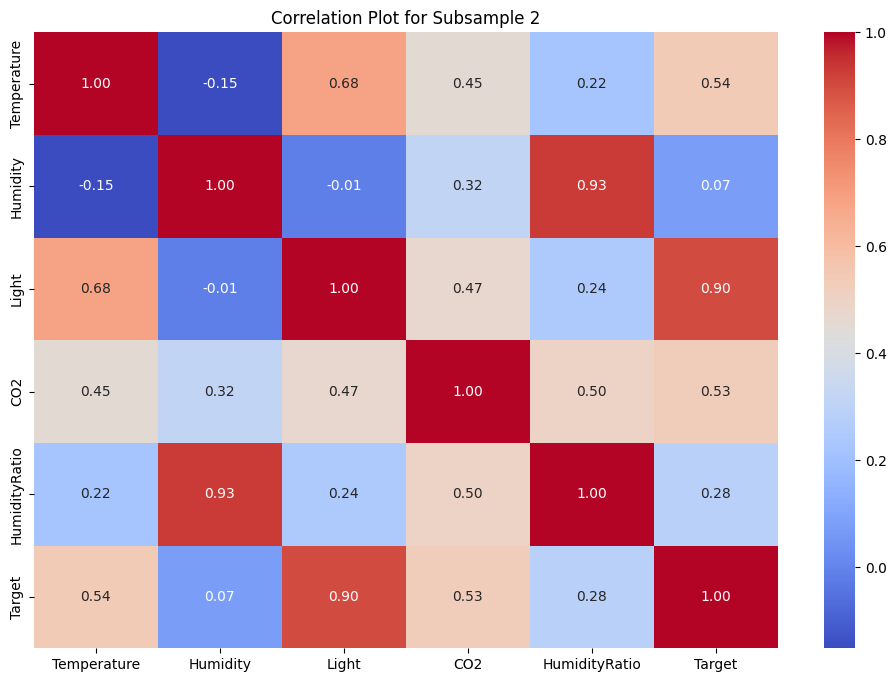

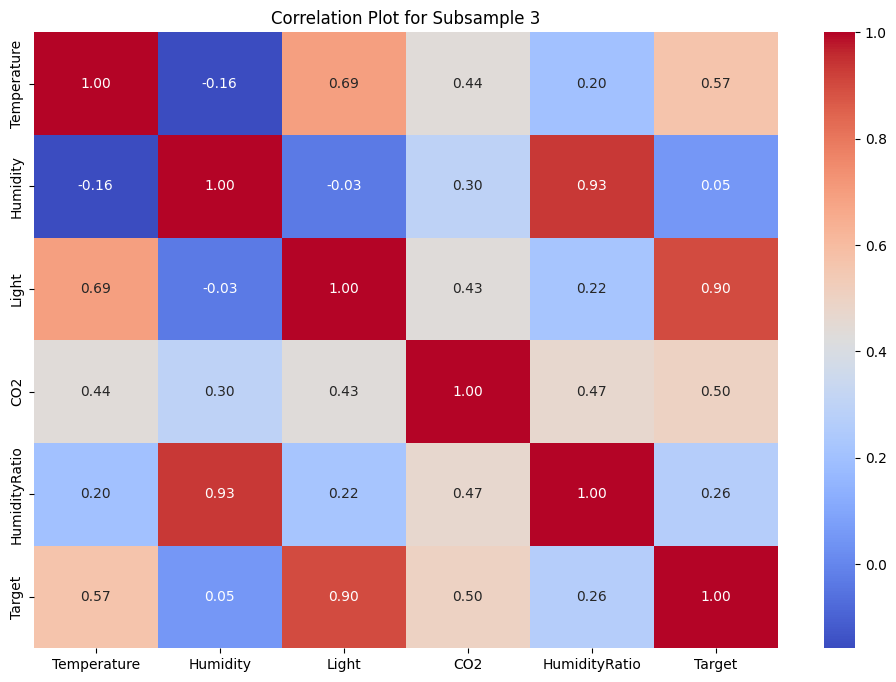

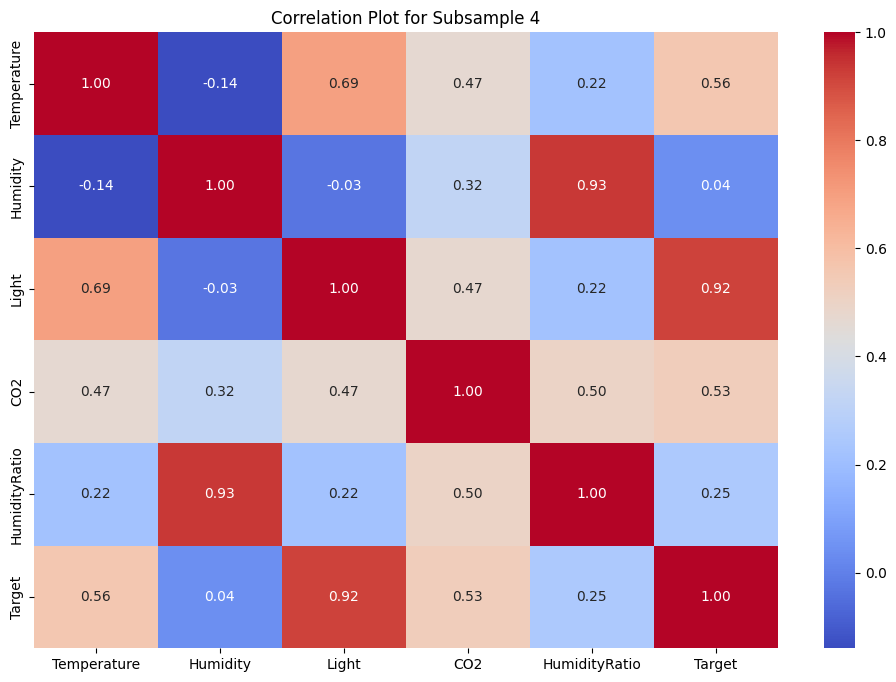

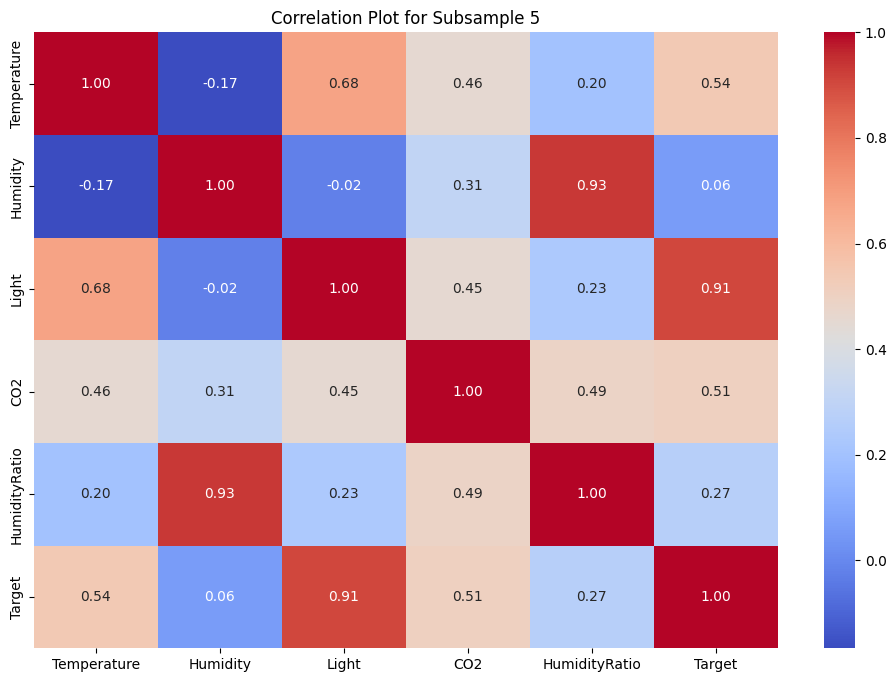

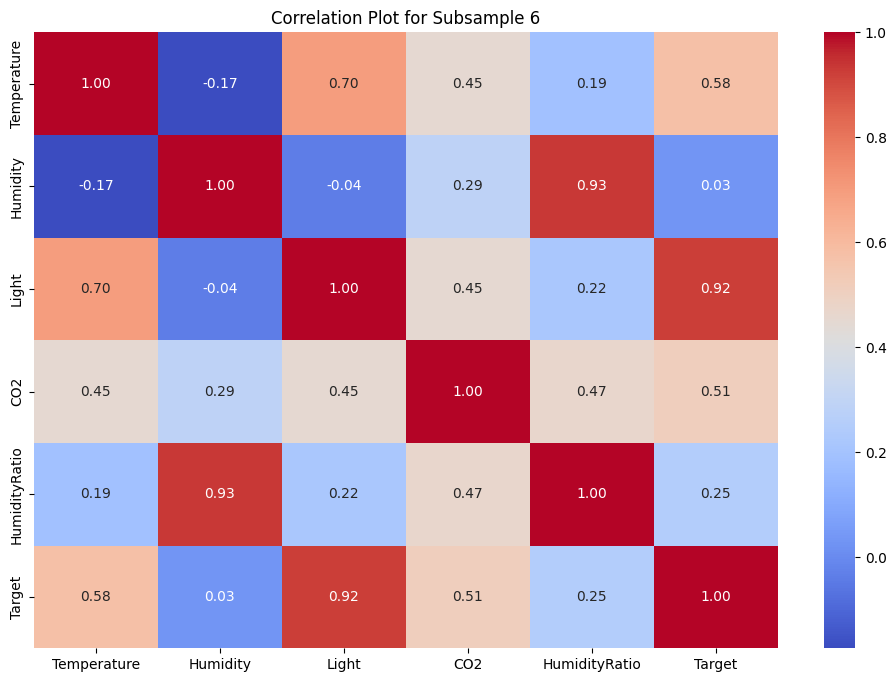

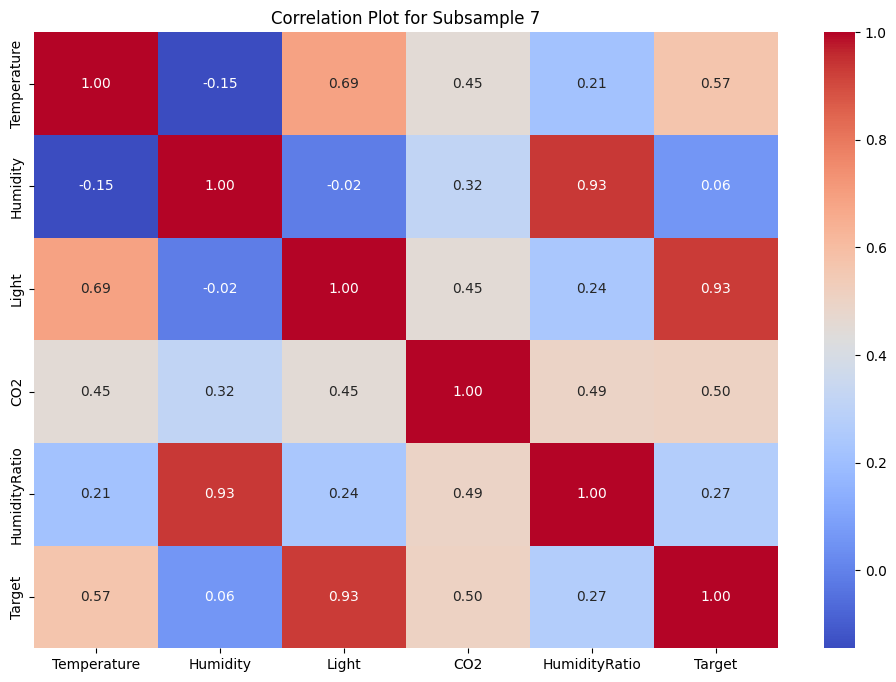

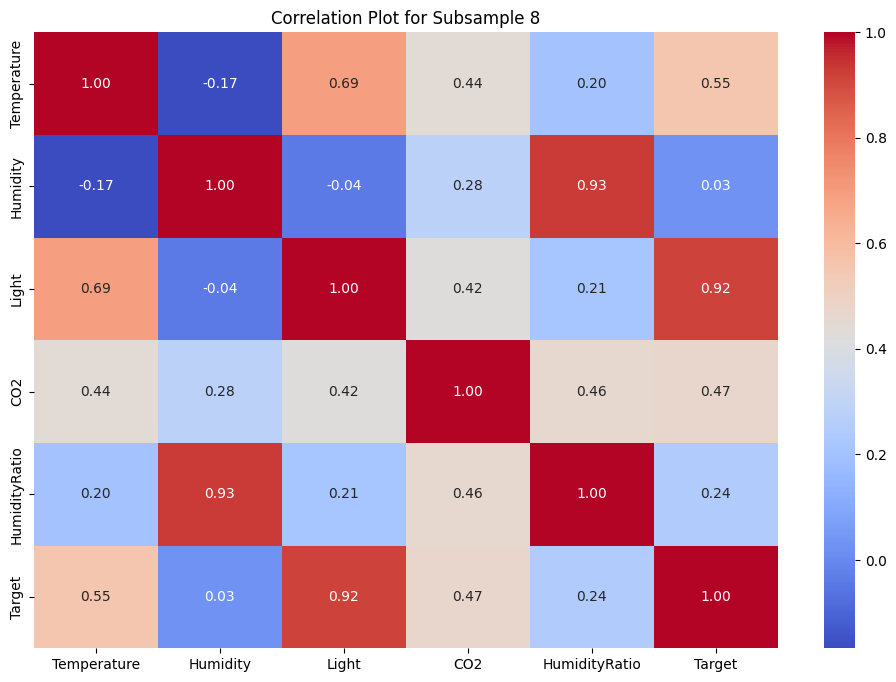

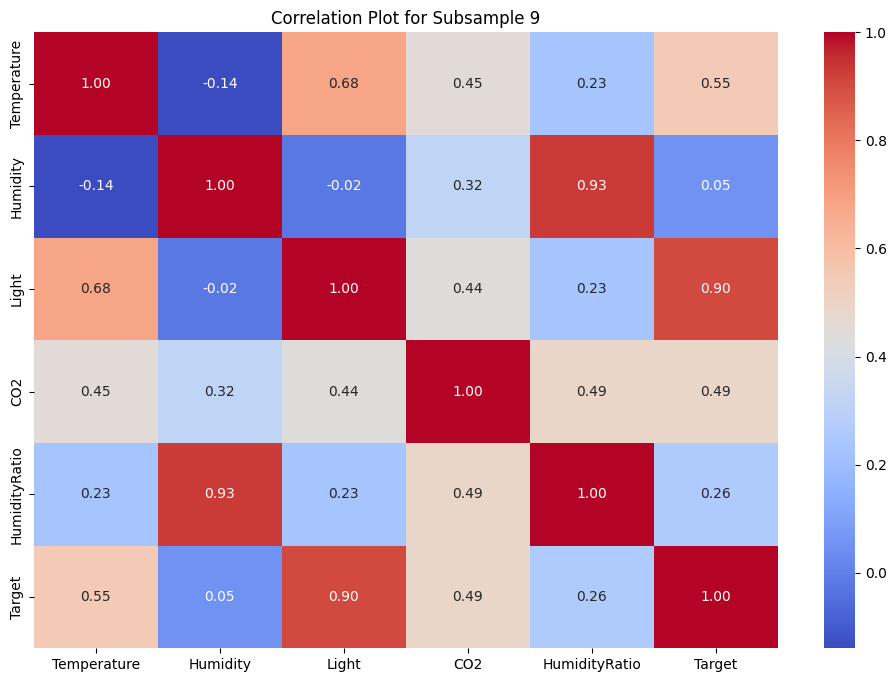

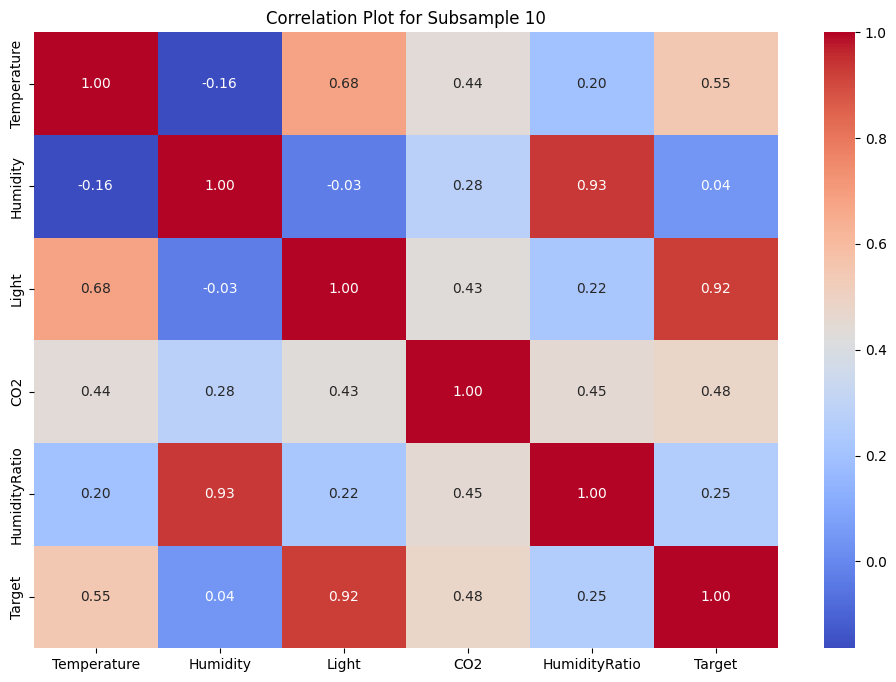

In [2]:
# Generate 10 moderately sized subsamples (20% of the original dataset each)
subsamples = [data.sample(frac=0.2, random_state=i) for i in range(10)]

# Create a correlation plot for each subsample
for i, subsample in enumerate(subsamples):
    plt.figure(figsize=(12, 8))
    corr = subsample.corr()
    sns.heatmap(corr, annot=True, fmt='.2f', cmap='coolwarm', cbar=True)
    plt.title(f'Correlation Plot for Subsample {i+1}')
    plt.show()


**TASK (Classification): If your problem is a classification problem visually check if the target variable is imbalanced**
**TASK (Regression): If your problem is a regression problem visually the distribution of your target variabe**

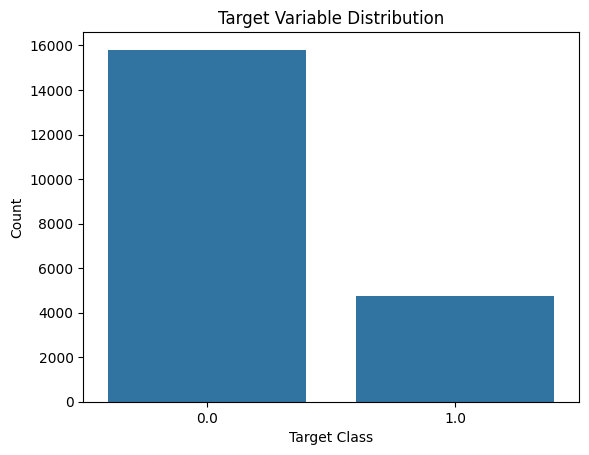

In [3]:
sns.countplot(x='Target', data=data)
plt.title('Target Variable Distribution')
plt.xlabel('Target Class')
plt.ylabel('Count')
plt.show()


**TASK: Take 10 moderately sized subsamples and create a pairplot of the feature variable in relation to the target variable**

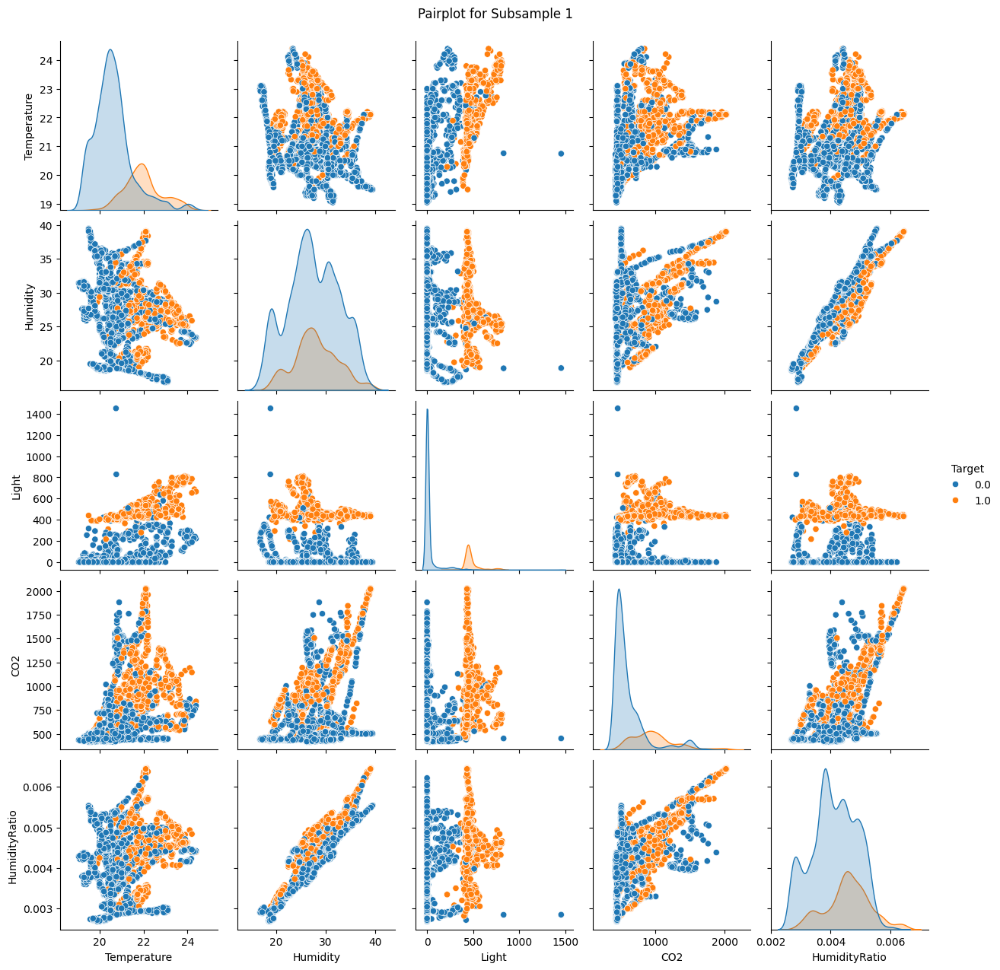

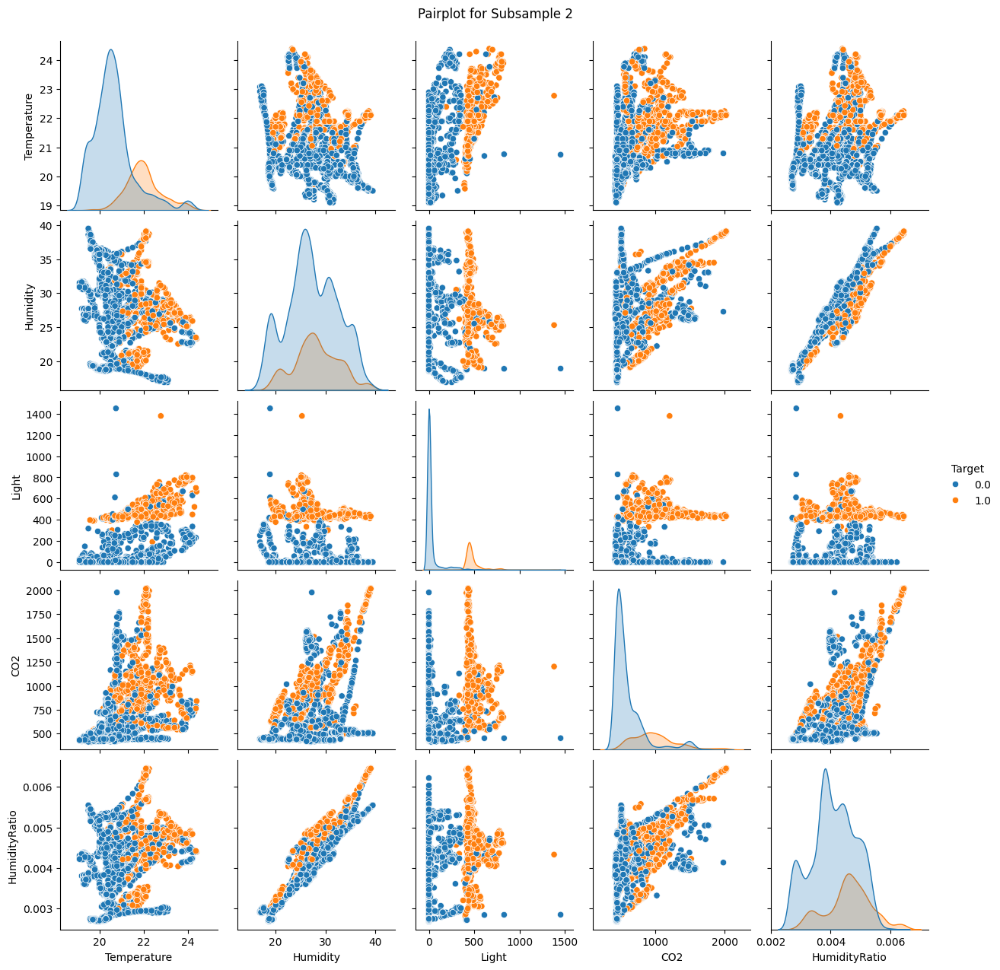

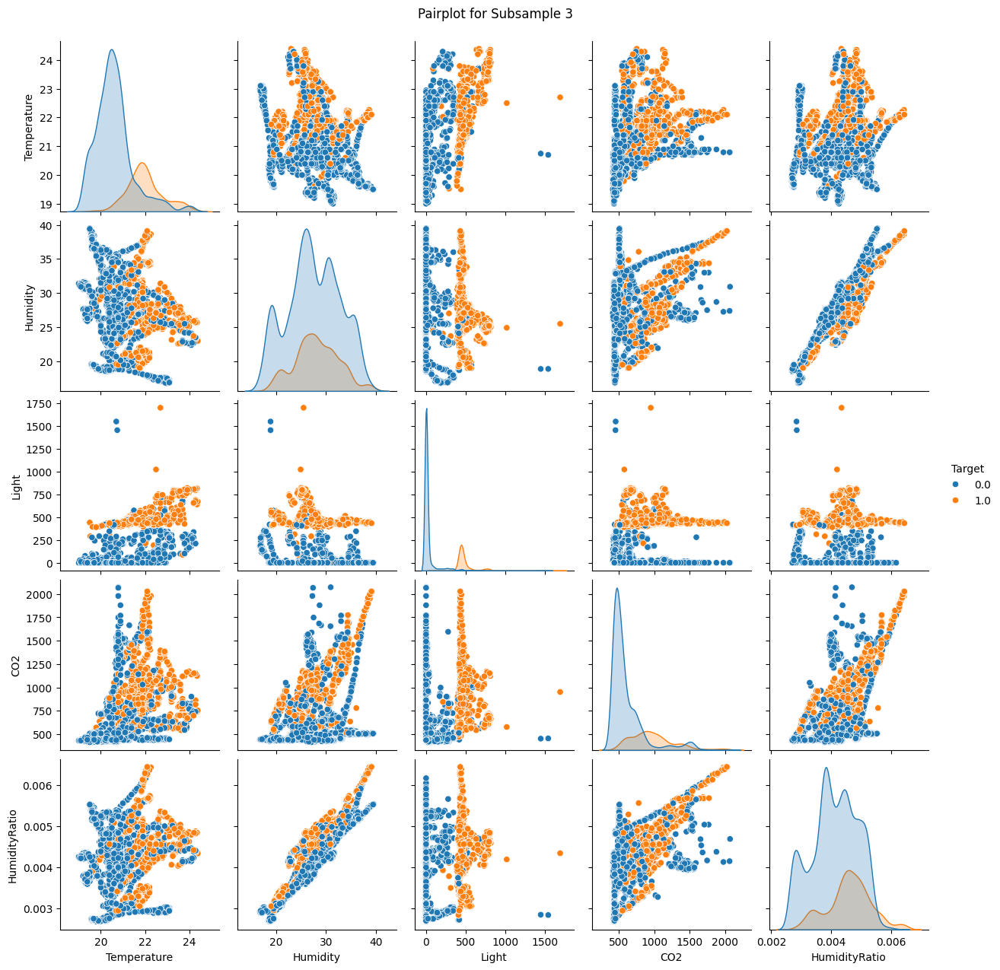

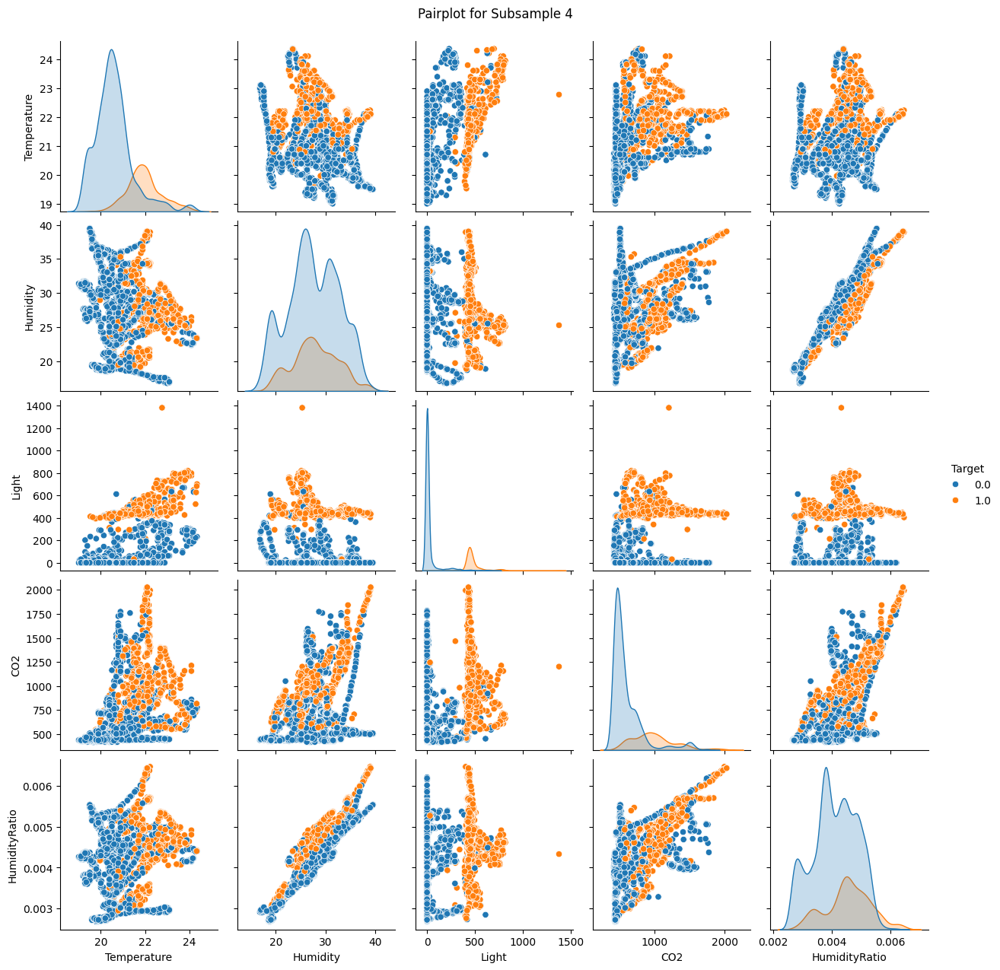

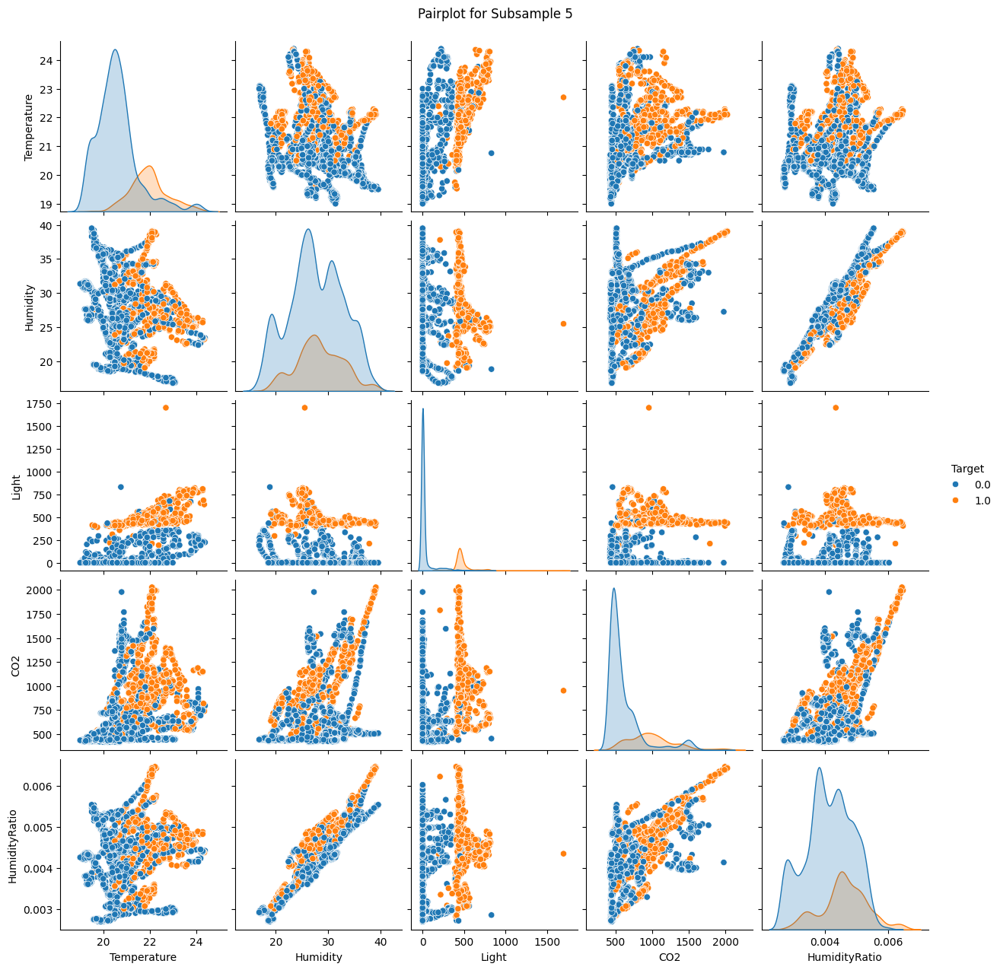

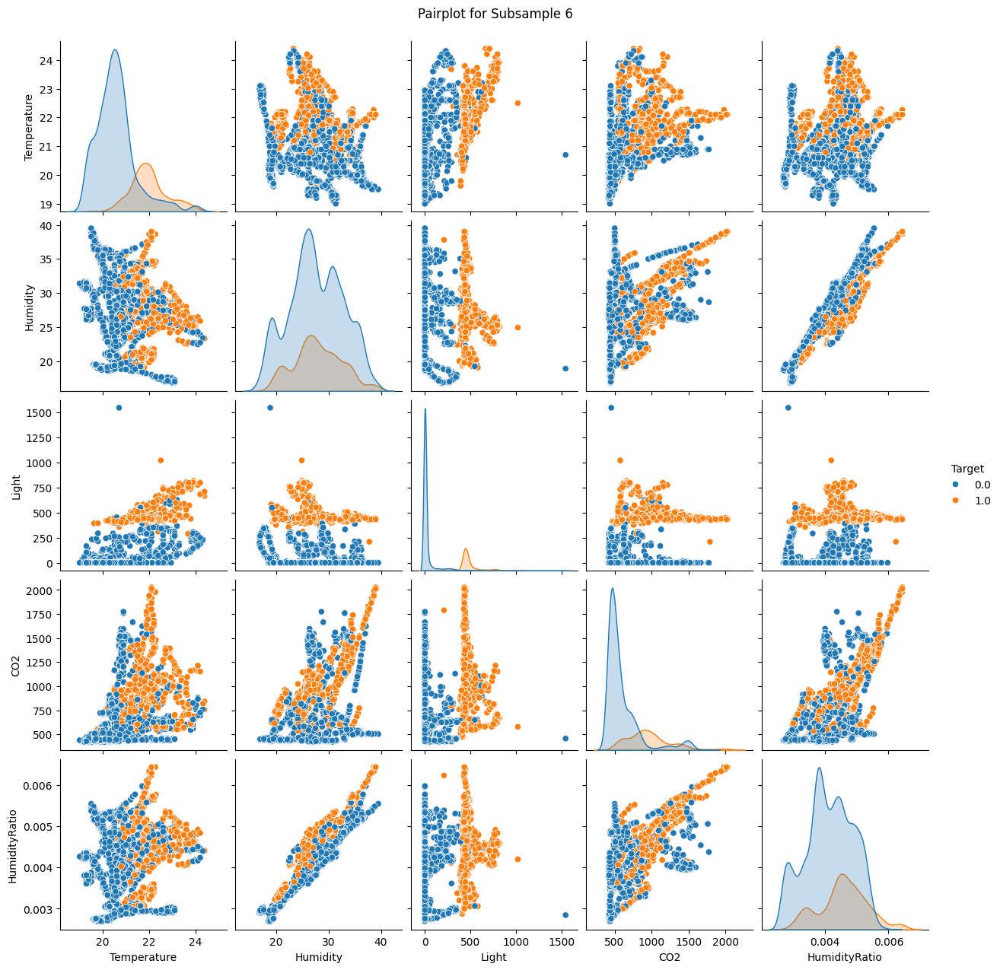

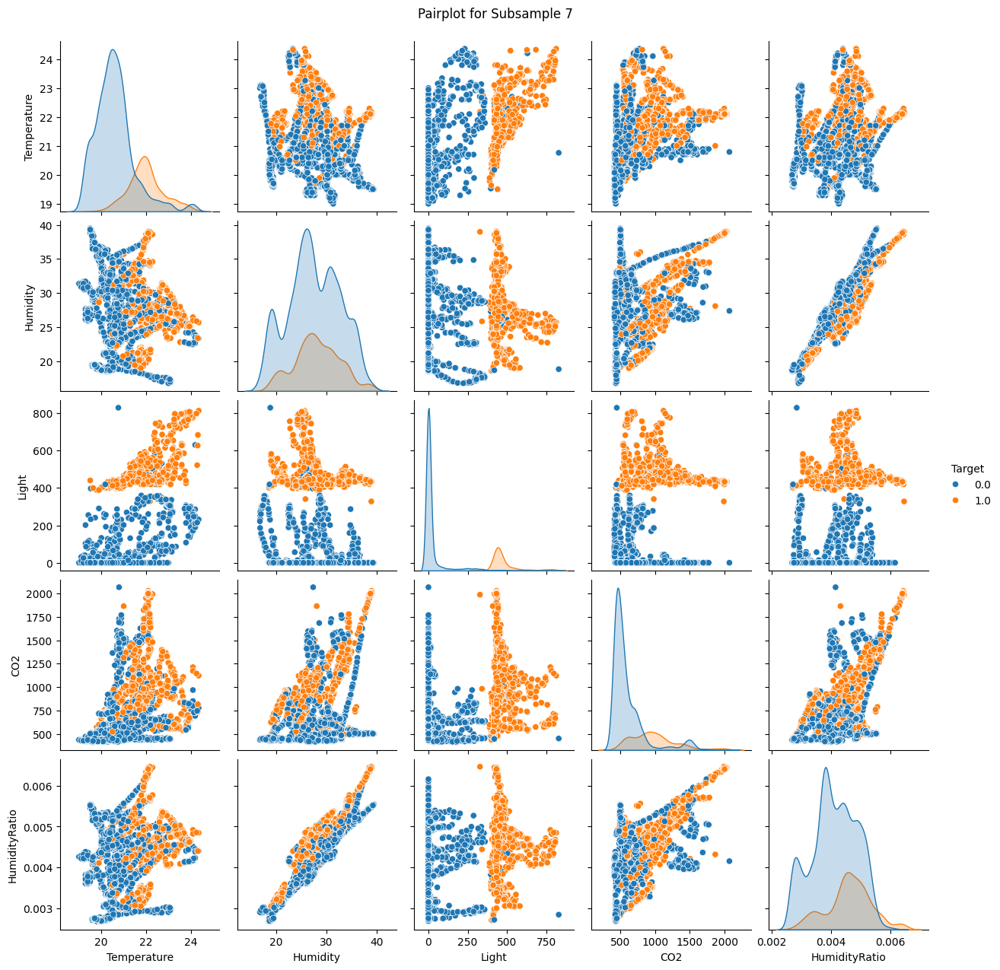

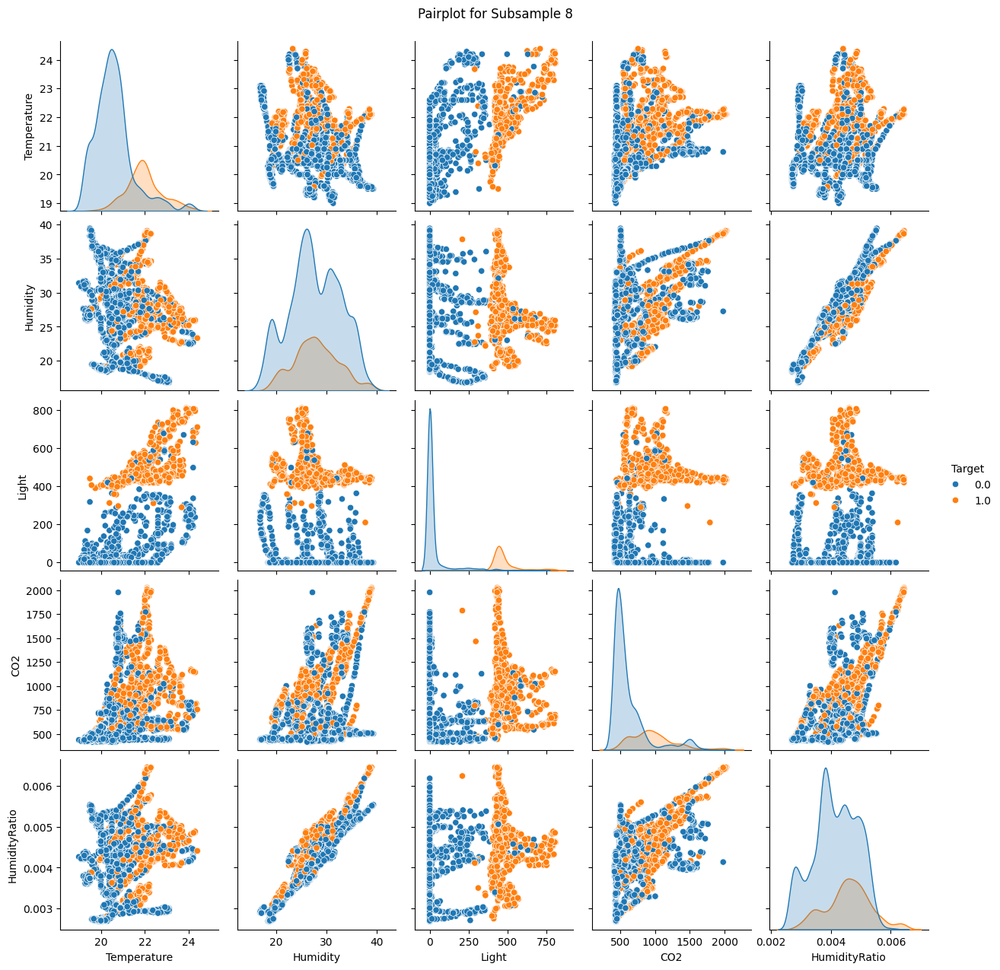

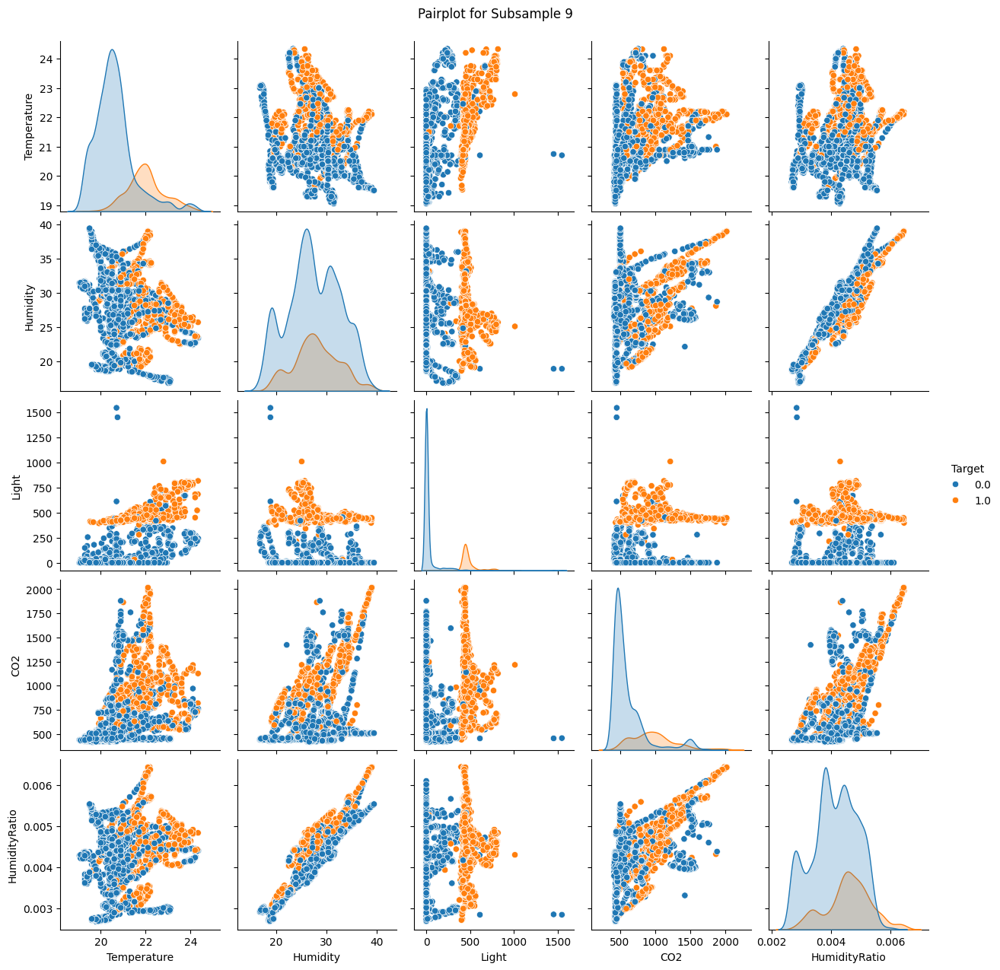

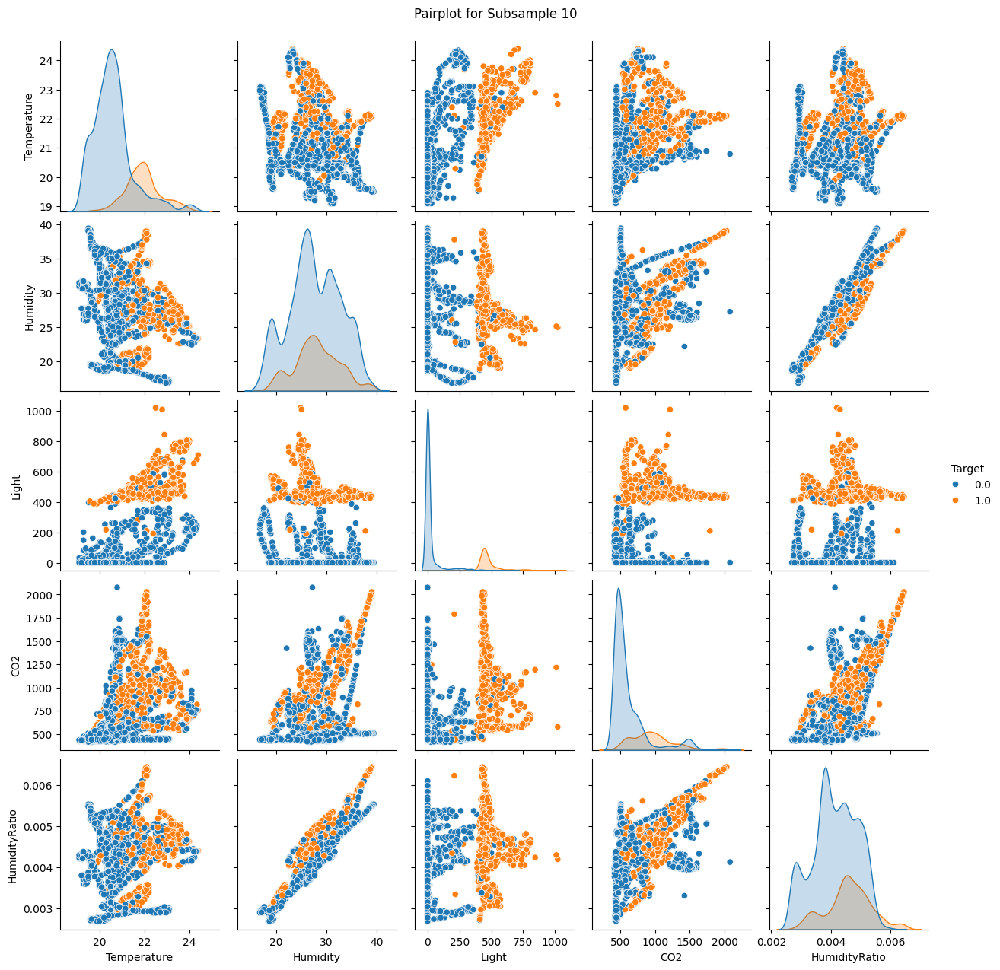

In [4]:
import seaborn as sns

# Create a pairplot for each existing subsample
for i, subsample in enumerate(subsamples):
    pairplot = sns.pairplot(subsample, hue='Target')
    pairplot.fig.suptitle(f'Pairplot for Subsample {i+1}', y=1.02)
    plt.show()


**TASK: Create a clustermap with seaborn to explore the relationships between variables.**

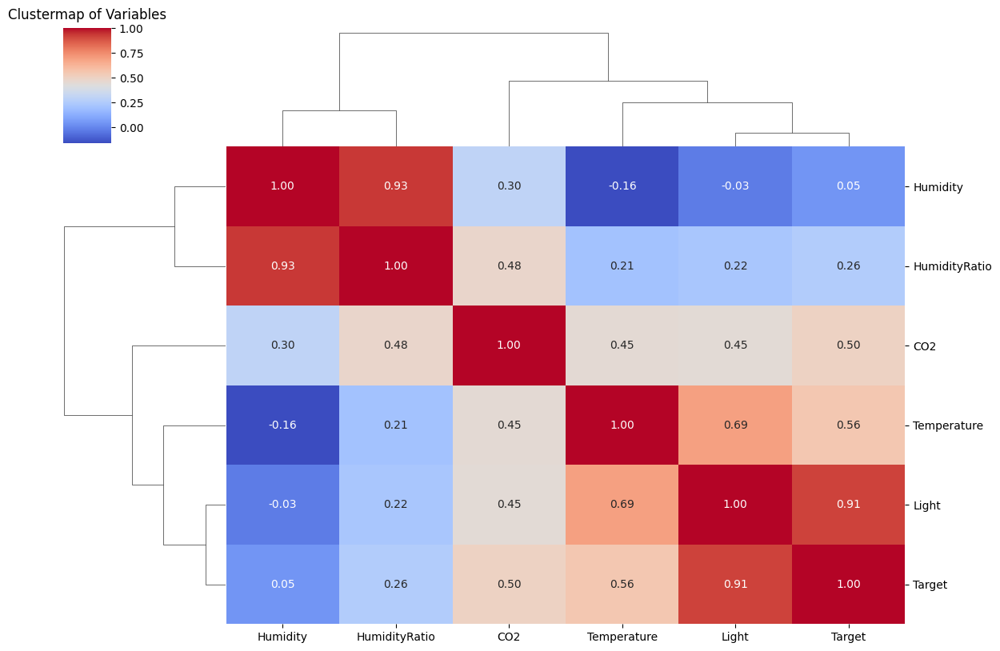

In [5]:
# Create a clustermap to explore relationships between variables
clustermap = sns.clustermap(data.corr(), annot=True, fmt='.2f', cmap='coolwarm', figsize=(12, 8))
plt.title('Clustermap of Variables', y=1.02)
plt.show()


**TASK: Perform SVM modelling and check the performance of your model, improve the performance of your model using grdisearch**

In [1]:
# Import necessary libraries
from ucimlrepo import fetch_ucirepo
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
6
# Fetch dataset
occupancy_detection = fetch_ucirepo(id=357)

# Data (as pandas dataframes)
X = occupancy_detection.data.features
y = occupancy_detection.data.targets

# Combine features and target for convenience
data = X.copy()
data['Target'] = y

# Display the first few rows of the dataset
print(data.head())

# Identify non-numeric columns
non_numeric_columns = data.select_dtypes(include=['object']).columns
print("Non-numeric columns:", non_numeric_columns)

# Remove the 'date' column
data = data.drop(columns=['date'])

# Convert remaining columns to numeric
for column in data.columns:
    if data[column].dtype == 'object':
        data[column] = pd.to_numeric(data[column], errors='coerce')

# Check for missing values
print("Missing values in each column:\n", data.isna().sum())

# Impute missing values by filling with the mean of each column
data = data.fillna(data.mean())

# Verify that there are no more missing values
print("Missing values after imputation:\n", data.isna().sum())

# Split the data into features (X) and target (y)
X = data.drop(columns=['Target'])
y = data['Target']

# Verify the target variable is categorical
print("Unique values in target variable:", y.unique())
y = y.astype('int')
print("Unique values in target variable after conversion:", y.unique())

# Split the data into training (80%) and testing (20%) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train an initial SVM model
svm_model = SVC()
svm_model.fit(X_train, y_train)

# Predict on the test set
y_pred = svm_model.predict(X_test)

# Evaluate the initial model
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Define the parameter grid for GridSearchCV
param_grid = {
    'C': [0.1, 1, 10],
    'gamma': [1, 0.1, 0.01],
    'kernel': ['linear', 'rbf']
}

# Initialize GridSearchCV with cross-validation (cv=5)
grid_search = GridSearchCV(SVC(), param_grid, refit=True, verbose=2, cv=5)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Print the best parameters and estimator
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Estimator: {grid_search.best_estimator_}")

# Predict on the test set using the best estimator
y_pred_best = grid_search.best_estimator_.predict(X_test)

# Evaluate the improved model
print("Confusion Matrix (Best Estimator):")
print(confusion_matrix(y_test, y_pred_best))
print("\nClassification Report (Best Estimator):")
print(classification_report(y_test, y_pred_best))


                  date Temperature Humidity  Light     CO2  \
0  2015-02-04 17:51:00       23.18   27.272    426  721.25   
1  2015-02-04 17:51:59       23.15  27.2675  429.5     714   
2  2015-02-04 17:53:00       23.15   27.245    426   713.5   
3  2015-02-04 17:54:00       23.15     27.2    426  708.25   
4  2015-02-04 17:55:00        23.1     27.2    426   704.5   

         HumidityRatio  Target  
0  0.00479298817650529     1.0  
1  0.00478344094931065     1.0  
2  0.00477946352442199     1.0  
3  0.00477150882608175     1.0  
4  0.00475699293331518     1.0  
Non-numeric columns: Index(['date', 'Temperature', 'Humidity', 'Light', 'CO2', 'HumidityRatio'], dtype='object')
Missing values in each column:
 Temperature      2
Humidity         2
Light            2
CO2              2
HumidityRatio    2
Target           2
dtype: int64
Missing values after imputation:
 Temperature      0
Humidity         0
Light            0
CO2              0
HumidityRatio    0
Target           0
dtype: in